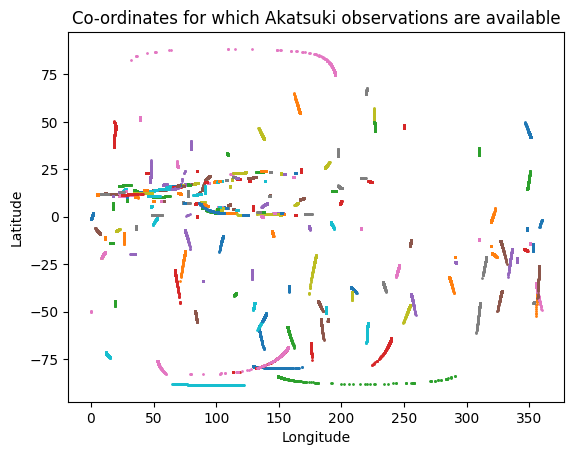

In [29]:
import os
import requests
import pandas as pd
import matplotlib.pyplot as plt
from bs4 import BeautifulSoup
import numpy as np

# Base directory path
base = '/home/dev/Desktop/Venus/Data'

# List of directories to process
directories = ['vcors_2001', 'vcors_2002', 'vcors_2003', 'vcors_2004']
subdirectories = ['l3', 'l4']
subsubdirectories = ["ingress","egress"]
# Plotting the data from CSV files in the 'l3' subdirectories
for directory in directories:
    for subdir in subdirectories:
        for subsubdir in subsubdirectories:
        # Directory path
            path = os.path.join(base, directory, subdir,subsubdir)

            # Get the list of CSV files in the directory
            csv_files = [file for file in os.listdir(path) if file.endswith('.csv')]

            # Plotting the data from CSV files
            for csv_file in csv_files:
                file_path = os.path.join(path, csv_file)
                df = pd.read_csv(file_path)
                longitude = df.iloc[:, -2]
                latitude = df.iloc[:, -1]
                plt.scatter(longitude, latitude, s=1, label=file_path)

                unique_latitudes = np.unique(latitude)
                # for lat in unique_latitudes:
                #     plt.plot(np.arange(0, 361), np.full(361, lat), color='gray', linestyle='-', alpha=0.1)

# Set plot labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Co-ordinates for which Akatsuki observations are available')

# Add legend and display the plot
# plt.legend()
plt.show()

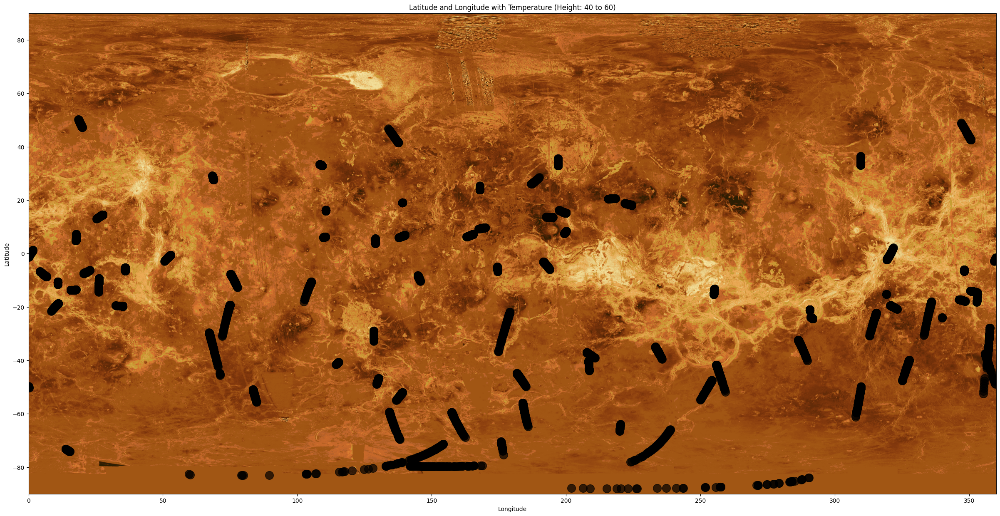

In [30]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Path to the combo folder
combo_folder = '/home/dev/Desktop/Venus/Data/combo/l2_l3_l4'

# constraints
height_min = 40
height_max = 60
venus_radius = 6051.8

# Calculate the aspect ratio of the image
# image = plt.imread('/home/dev/Desktop/Venus/Images/venmap2.tif')
image = plt.imread('/home/dev/Desktop/Venus/Images/venmap.gif')
# image = plt.imread(image_path)
image_aspect_ratio = image.shape[1] / image.shape[0]

# Create a figure with dimensions based on the image aspect ratio
width = 30
height = width / image_aspect_ratio
fig, ax = plt.subplots(figsize=(width, height))

# Display the image as the background
ax.imshow(image, extent=[0, 360, -90, 90], aspect='auto')

# Iterate over the files in the combo folder
for filename in os.listdir(combo_folder):
    if filename.endswith('.csv'):
        file_path = os.path.join(combo_folder, filename)

        # Load the combined dataset
        df = pd.read_csv(file_path)

        # Extract the required columns
        latitude = df['LATITUDE_y']
        longitude = df['LONGITUDE_y']
        temperature = df['TEMPERATURE_MEDIUM_TEMPERATURE_AT_BOUNDARY']
        height = df['RADIUS_y'] - venus_radius

        # Filter data based on height constraints
        mask = (height >= height_min) & (height <= height_max)
        latitude = latitude[mask]
        longitude = longitude[mask]
        temperature = temperature[mask]

        # Plot latitude, longitude, and temperature
        # scatter = ax.scatter(longitude, latitude, c=temperature,s=200, cmap='viridis', alpha=0.7)
        scatter = ax.scatter(longitude, latitude,color = "black",s=200, alpha=0.7)
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_title('Latitude and Longitude with Temperature (Height: {} to {})'.format(height_min, height_max))

# Add a colorbar
# cbar = fig.colorbar(scatter, ax=ax, label='Temperature (°C)')

# Show the plot
plt.show()


##### Occultation events and the antenna used to record the data during the same

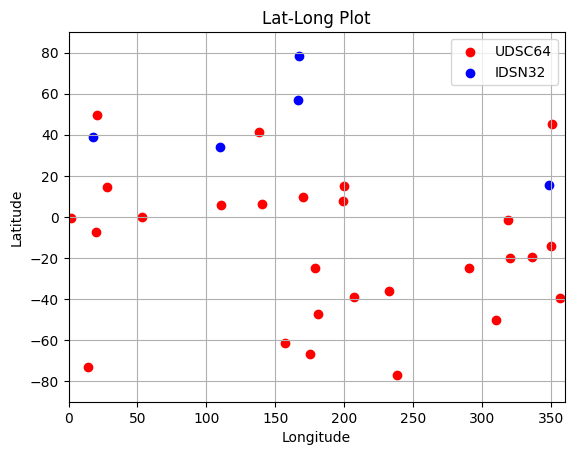

In [31]:
import matplotlib.pyplot as plt
import numpy as np

# Latitude and Longitude data
latitude = [-39.56, -66.94, 0.17, -36.11, 5.67, -24.95, 6.53, -19.94, 9.70, -14.03,
            15.29, -7.26, 45.33, 49.65, 7.54, -25.01, -73.10, -50.05, -77.21, -19.28,
            -61.55, -0.65, -47.46, 14.71, -38.92, 34.23, 41.56, -1.57, 56.78, 15.48,
            78.28, 39.03]
longitude = [356.49, 175.34, 53.13, 232.83, 110.79, 290.72, 140.33, 320.36, 170.15, 350.22,
             200.28, 20.28, 351.25, 20.70, 199.06, 178.97, 13.82, 309.98, 238.28, 336.20,
             157.25, 1.87, 181.19, 27.95, 207.32, 109.60, 137.96, 319.11, 166.23, 348.42,
             167.59, 18.09]
antenna = ['UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64',
           'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64',
           'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64',
           'UDSC64', 'IDSN32', 'UDSC64', 'UDSC64', 'IDSN32', 'IDSN32', 'IDSN32', 'IDSN32']

# Define colors for each antenna
colors = {'UDSC64': 'red', 'IDSN32': 'blue'}

# Plotting Latitude and Longitude with different colors for each antenna
legend_labels = {}  # Track antennas already plotted
for lat, lon, ant in zip(latitude, longitude, antenna):
    if ant not in legend_labels:
        plt.scatter(lon, lat, color=colors[ant], label=ant)
        legend_labels[ant] = True
    else:
        plt.scatter(lon, lat, color=colors[ant])

# Plotting horizontal lines for each latitude
unique_latitudes = np.unique(latitude)
# for lat in unique_latitudes:
#     plt.plot(np.arange(0, 361), np.full(361, lat), color='green', linestyle='--', alpha=0.5)

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Lat-Long Plot')
plt.xlim(0,360)
plt.ylim(-90,90)
plt.grid(True)
plt.legend()
plt.show()

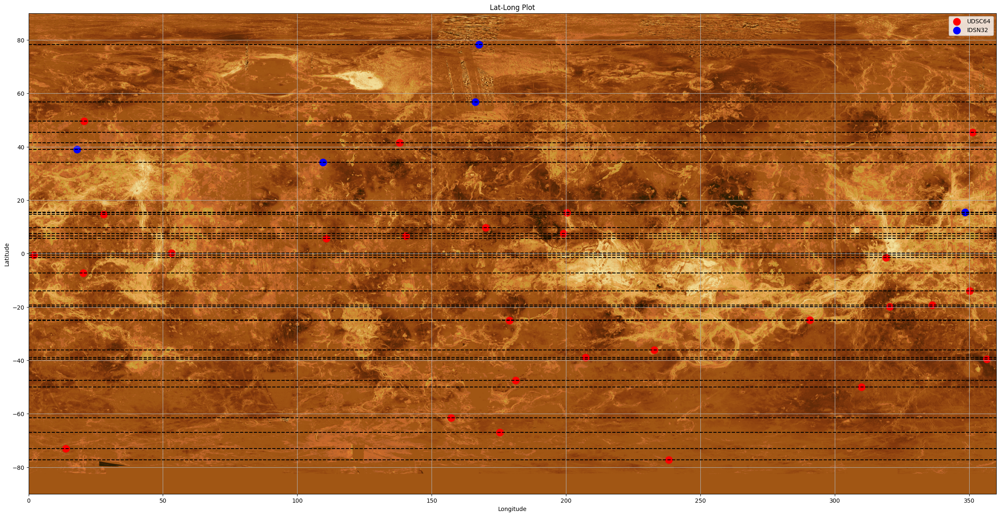

In [32]:
import matplotlib.pyplot as plt
import numpy as np

# Latitude and Longitude data
latitude = [-39.56, -66.94, 0.17, -36.11, 5.67, -24.95, 6.53, -19.94, 9.70, -14.03,
            15.29, -7.26, 45.33, 49.65, 7.54, -25.01, -73.10, -50.05, -77.21, -19.28,
            -61.55, -0.65, -47.46, 14.71, -38.92, 34.23, 41.56, -1.57, 56.78, 15.48,
            78.28, 39.03]
longitude = [356.49, 175.34, 53.13, 232.83, 110.79, 290.72, 140.33, 320.36, 170.15, 350.22,
             200.28, 20.28, 351.25, 20.70, 199.06, 178.97, 13.82, 309.98, 238.28, 336.20,
             157.25, 1.87, 181.19, 27.95, 207.32, 109.60, 137.96, 319.11, 166.23, 348.42,
              167.59, 18.09]
antenna = ['UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64',
           'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64',
           'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64', 'UDSC64',
           'UDSC64', 'IDSN32', 'UDSC64', 'UDSC64', 'IDSN32', 'IDSN32', 'IDSN32', 'IDSN32']

# Define colors for each antenna
colors = {'UDSC64': 'red', 'IDSN32': 'blue'}

# Load the image
# image = plt.imread('/home/dev/Desktop/Venus/Images/venmap2.tif')
image = plt.imread('/home/dev/Desktop/Venus/Images/venmap.gif')
# Calculate the aspect ratio of the image
image_aspect_ratio = image.shape[1] / image.shape[0]

# Set the dimensions of the plot area to match the image aspect ratio
fig_width = 30
fig_height = fig_width / image_aspect_ratio

# Create a figure with the specified dimensions
fig, ax = plt.subplots(figsize=(fig_width, fig_height))

# Display the image as the background
ax.imshow(image, extent=[0, 360, -90, 90], aspect='auto')

# Plotting Latitude and Longitude with different colors for each antenna
legend_labels = {}  # Track antennas already plotted
for lat, lon, ant in zip(latitude, longitude, antenna):
    if ant not in legend_labels:
        ax.scatter(lon, lat, color=colors[ant],s=150, label=ant)
        legend_labels[ant] = True
    else:
        ax.scatter(lon, lat, color=colors[ant],s=150)

# Plotting horizontal lines for each latitude
unique_latitudes = np.unique(latitude)
for lat in unique_latitudes:
    ax.plot(np.arange(0, 361), np.full(361, lat), color='black', linestyle='--', alpha=1)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Lat-Long Plot')
ax.set_xlim(0, 360)
ax.set_ylim(-90, 90)
ax.grid(True)
ax.legend()

# Show the plot
plt.show()
